# Import data

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

from DLtools import  prep_data
import seaborn as sns


In [2]:
rain = 'data/instant_data/rain.csv'
water = 'data/instant_data/water.csv'
rw = prep_data.instant_df(rain_csv=rain,water_csv=water)
# Conduct Dataframe
df = rw.df

# Discard NaN value

In [3]:
rw.report_missing_by_year()

avaliable data in *2007* is ........113150.00 || missing....100.00%
avaliable data in *2008* is ........113460.00 || missing....100.00%
avaliable data in *2009* is ........113150.00 || missing....100.00%
avaliable data in *2010* is ........113150.00 || missing....99.90%
avaliable data in *2011* is ........113150.00 || missing....99.45%
avaliable data in *2012* is ........113460.00 || missing....82.41%
avaliable data in *2013* is ........113150.00 || missing....63.59%
avaliable data in *2014* is ........113150.00 || missing....59.96%
avaliable data in *2015* is ........113150.00 || missing....61.88%
avaliable data in *2016* is ........113460.00 || missing....61.95%
avaliable data in *2017* is ........113150.00 || missing....62.09%
avaliable data in *2018* is ........113150.00 || missing....61.79%
avaliable data in *2019* is ........113150.00 || missing....54.65%
avaliable data in *2020* is ........66030.00 || missing....54.55%


In [4]:
# select from 2013 due to missing data issue
start = '2013-01-01'
stop = '2018-12-31'
rw = prep_data.instant_df(rain_csv=rain,water_csv=water,start=start,stop=stop)

# Conduct Dataframe
df_water = rw.water_df     #raw info, not sampling yet
df_rain = rw.rain_df
df = rw.df                # df_water was resampling

col_r = rw.col_rain
col_w = rw.col_water

In [9]:
useful_col = rw.report_missing_by_station()

ST.......nan|total
TBW014_w.......3855||527,......4382
CPY017_w.......2380||2002,......4382
PIN003_w.......2803||1579,......4382
PIN006_w.......2762||1620,......4382
PIN002_w.......2711||1671,......4382
DIV005_w.......2527||1855,......4382
BKK004_w.......2374||2008,......4382
NAN004_w.......2538||1844,......4382
CPY006_w.......2490||1892,......4382
PIN005_w.......2971||1411,......4382
TB0002_w.......3216||1166,......4382
BKK020_w.......2418||1964,......4382
BKK019_w.......2323||2059,......4382
CPY016_w.......2293||2089,......4382
BKK013_w.......2474||1908,......4382
CPY014_w.......2478||1904,......4382
CPY005_w.......3099||1283,......4382
GLF001_w.......2511||1871,......4382
CPY015_w.......2397||1985,......4382
VLGE12_w.......2868||1514,......4382
BKK005_w.......2418||1964,......4382
CHM006_w.......2236||2146,......4382
NAN013_w.......2250||2132,......4382
CHM004_w.......2359||2023,......4382
NAN003_w.......2617||1765,......4382
CHM002_w.......2206||2176,......4382
NAN009_w.......2374|

In [11]:
df_final = df[useful_col]
print(len(useful_col))
print(useful_col)

52
['CPY017_w', 'BKK004_w', 'BKK019_w', 'CPY016_w', 'CPY015_w', 'CHM006_w', 'NAN013_w', 'CHM004_w', 'CHM002_w', 'NAN009_w', 'BKK018_w', 'CPY003_w', 'THA001_w', 'CPY010_w', 'KWN002_w', 'NAN011_w', 'BKK002_w', 'CPY004_w', 'CPY009_w', 'NAN010_w', 'BKK007_w', 'THA002_w', 'NAN012_w', 'PIN001_w', 'PIN004_w', 'CPY003_r', 'NAN010_r', 'CPY009_r', 'BKK007_r', 'CPY015_r', 'CHM002_r', 'THA002_r', 'THA001_r', 'CPY004_r', 'BKK002_r', 'PIN005_r', 'CHM006_r', 'CPY010_r', 'PIN001_r', 'CHM004_r', 'CPY017_r', 'BKK018_r', 'BKK001_r', 'PIN003_r', 'KWN002_r', 'BKK019_r', 'NAN012_r', 'NAN011_r', 'NAN006_r', 'PIN004_r', 'NAN013_r', 'CPY016_r']


In [33]:
df_final.shape

(4382, 52)

# Visualizae

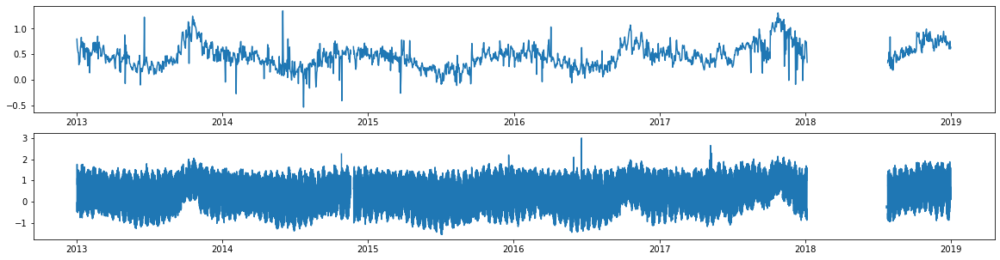

In [34]:
fig,ax = plt.subplots(2,1,figsize=(20,5))
ax[0].plot(df_final["CPY015_w"])
ax[1].plot(df_water["CPY015_w"])


# PLOTPY

In [14]:
import plotly.graph_objects as go
import plotly as py

In [35]:
viz_water = go.Scatter(x=df_final['CPY015_w'].index,
                         y=df_final['CPY015_w'].values)

layout = go.Layout(title='Water level CPY015(target station)', xaxis=dict(title='Date'),yaxis=dict(title='(mm)'))
fig = go.Figure(data=[viz_water], layout=layout)
fig.show()

In [17]:
#print("for water level")
def intersection(lst1, lst2): 
            return list(set(lst1) & set(lst2))
col_W = intersection(df_final.columns,col_w)            

fig = go.Figure()
for y in col_W:    
    fig.add_trace(go.Scatter(x=df_final.index, y=df_final[y],mode='lines',name=y))
fig.show()


In [18]:
col_R = intersection(df_final.columns,col_r)            

fig = go.Figure()
for y in col_R:    
    fig.add_trace(go.Scatter(x=df_final.index, y=df_final[y],mode='lines',name=y))
fig.show()

In [19]:
#Findding outlier
def print_maxmin(df,col):
    for y in col:
        print("{}...Max:{:.2f},.....Min:{:.2f}".format(y,np.max(df[y]),np.min(df[y])))

In [36]:
print_maxmin(df_final,col_R)
print("="*50)
print_maxmin(df_final,col_W)

CPY003_r...Max:71.80,.....Min:0.00
PIN001_r...Max:74.40,.....Min:0.00
CHM004_r...Max:109.20,.....Min:0.00
CPY017_r...Max:68.80,.....Min:0.00
BKK019_r...Max:73.20,.....Min:0.00
NAN012_r...Max:103.00,.....Min:0.00
CPY004_r...Max:66.00,.....Min:0.00
NAN010_r...Max:54.60,.....Min:0.00
CPY009_r...Max:48.20,.....Min:0.00
BKK007_r...Max:94.60,.....Min:0.00
BKK018_r...Max:80.20,.....Min:0.00
NAN011_r...Max:66.80,.....Min:0.00
CPY015_r...Max:78.00,.....Min:0.00
BKK002_r...Max:71.40,.....Min:0.00
CHM002_r...Max:128.60,.....Min:0.00
BKK001_r...Max:88.20,.....Min:0.00
THA002_r...Max:78.80,.....Min:0.00
PIN005_r...Max:61.20,.....Min:0.00
PIN003_r...Max:70.20,.....Min:0.00
NAN006_r...Max:65.20,.....Min:0.00
KWN002_r...Max:93.40,.....Min:0.00
CHM006_r...Max:70.20,.....Min:0.00
PIN004_r...Max:95.00,.....Min:0.00
CPY010_r...Max:68.60,.....Min:0.00
NAN013_r...Max:123.80,.....Min:0.00
CPY016_r...Max:98.40,.....Min:0.00
THA001_r...Max:78.00,.....Min:0.00
CPY017_w...Max:3.47,.....Min:-0.74
BKK004_w...Max:1

# Geo plot


In [21]:
waterST=rw.water_st_df
rainST=rw.rain_st_df

In [23]:
for i in waterST.index:
    waterST.at[i, "code"] = str(waterST.at[i, "code"]+"_w")
for i in rainST.index:
    rainST.at[i, "code"] = str(rainST.at[i, "code"]+"_r")   

In [37]:
print(len(col_W),len(col_R))

25 27


In [24]:
#Filter with col_W,col_R (useful columns)

#waterST.rename(columns=lambda x: x+'_w', inplace=True)
waterST = waterST.loc[waterST['code'].isin(col_W)]
#rainST.rename(columns=lambda x: x+'-_r', inplace=True)
rainST = rainST.loc[rainST['code'].isin(col_R)]

In [28]:
waterST['text'] = waterST['code']+' '+waterST['tambon'] + '' + waterST['amphoe'] + ', ' + waterST['province'] + '' + waterST['basin'].astype(str)
rainST['text'] = rainST['code'] + '' +rainST['tambon'] + '' + rainST['amphoe'] + ', ' + rainST['province'] + '' + rainST['basin'].astype(str)

<ipython-input-28-f1bc2af09b04>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-28-f1bc2af09b04>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [29]:
fig = go.Figure(data=go.Scattergeo(
        lon = rainST['long'],
        lat = rainST['lat'],
        text = rainST['text'],
        mode = 'markers',
        #marker_color = waterST['basin'],
        ))
fig.update_layout(
        title = 'Rain Stations in TH',
        geo_scope='asia',)
fig.show()

In [30]:
fig = go.Figure(data=go.Scattergeo(
        lon = waterST['long'],
        lat = waterST['lat'],
        text = waterST['text'],
        mode = 'markers',
        #marker_color = waterST['basin'],
        ))
fig.update_layout(
        title = 'Water Stations in TH',
        geo_scope='asia',)
fig.show()

In [38]:
waterST.sort_values('code').to_csv('water_st_useful.csv')

In [39]:
rainST.sort_values('code').to_csv('rain_st_useful.csv')